# Long Survy Data - CBS

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import importlib.util
import os
import sys
# import CohenimPy.ncPlot as ncPlot
# passing the file name and path as argument
spec = importlib.util.spec_from_file_location("ncPlot", "C:/Users/u30l/GitHub/CohenimTools/CohenimPy/ncPlot.py")
# importing the module as ncp
ncp  = importlib.util.module_from_spec(spec)
sys.modules["ncPlot"] = ncp
spec.loader.exec_module(ncp)
# test 
ncp.getVersion()

'0.662'

## Analysis of surveys with Financial Behavior (Chapter 8, only on the following years: 2013, 2016, 2018, 2020, 2023?)

* Importent to note: i deal very carfuly with unknown/missing values. I do not drop them, but rather fill them with NaN (np.nan or Blank in excel). 

In [2]:
# read from CBS long survey data about ownership of houses
# select year and file type:
year      = '2018' # 20212022
print('This analysis is for survey year: ' + year)
file_type = 'mb' # 'mb' for Meshek Bait, 'prat' for Prat
###
file_path = 'D:/Data/CBS/long/H'+year+'1281/'
file_name = 'h'+ year + '1281' + 'data' + file_type +'.csv'

List_of_NaN = [99999998,99999999] #  for unknown and refuse respectively, i will replace it with NaN (np.nan). NaN in the data is as missing value or empty value, meaning that the respondent did not answer the question or not relevat. 

This analysis is for survey year: 2018


In [3]:
# interesting fields in PRAT data
PRAT_lnteresting = [
'BrutoSachir',  # Gross income in the last month in which he worked from a main and additional salaried job (if any)
'hatavotLoBBruto', # The amount of benefits that were not included in the gross income in the last month from main and additional employment
'SacShnati_LePrat', # Total annual gross income for the individual from all jobs. From hired and independent work throughout the year, and from other work: babysitting, household work, private lessons, lectures or work from another source.
]

# interesting fields in HH data (MB = Meshek Bait)
HH_lnteresting = [
'Siduri',                  # Serial number of the household in the survey
's_seker',                # Survey year
'MishkalMb' ,              # Household weight in the survey year     
'sumHMosdotShnatitnew',    # Annual gross income per HH reported from government institutions and offices in Israel

'SacShnatikolel_Lembnew',  # Total annual gross income reported per HH (including individual income in HH)
'ChisachonAtid1',          # In the next twelve months, how likely are your family to save money?  
                        #       1 - Very likely, 
                        #       2 - Likely, 
                        #       3 - Not likely, 
                        #       4 - Not at all likely
'ChisachonHayom1',      # Which of the following sentences best describes you and your family's financial situation: 
                        #       1 - We save a lot, 
                        #       2 - We save a little, 
                        #       3 - The revenue is only enough to cover the expenses, 
                        #       4 - We have to use our savings to cover our expenses,
                        #       5 - We are in debt
'k_baalut1',            # Who owns the apartment you live in?
                        #       1 - Ownership, 
                        #       2 - Rent, 
                        #       3 - Family relative, 
                        #       4 - Employer, 
                        #       5 - Friends, 
                        #       6 - Kibbutz, 
                        #       7 - Other
'm_DmeSchirutChodeshi',    # Monthly rental fee
'M_ShuviDira',             # A subjective assessment of the value of an owned apartment (NIS) or last time you estimated that if you had sold the apartment you could have received X NIS. What amount do you think you could get if you sold your apartment today?

'BaalutDiraNosefet1',      # Do you own an apartment or other apartments in Israel, besides your own apartment? Including vacation rentals (asked who owns the residential apartment)     
'BaalutDiraNosefetKama1',  # How many other apartments in Israel do you own (besides your residential apartment) 
'BaalutDiraLLoBealim1',    # Do you own an apartment or apartments in Israel? Including vacation rentals (asked who does not own the residential apartment)
'BaalutDiraLLoBealimKama1', # How many apartments in Israel do you own (ask someone who does not own the residential apartment)

'ShuviDirotLoMegurim1',    # Valuation: How much could you get if you sold all your apartments today that you don't live in (NIS)

'KniyaAtiditDira1',        # In the next twelve months, do you intend to buy one or more apartments in Israel? Please, refer only to the purchase of apartments under private household ownership 
'm_KesefKniyaAtidit',      # What is the amount of money available to you today without loans, gifts or other sources, that you intend to invest in buying the apartment (NIS)

'KarkaChaklait1',          # 
'KarkaLoChaklait1',
'KarkaAcheret1',
'm_Mechirkarka',           # In your estimation, what amount could you get if you sold all your real estate assets today (NIS)

'm_HalvaaDiyur',           # Do you have a housing loan, active mortgage or active renovation loan
'm_SchumHalvaaDiyur1',     # What is the settlement balance for the mortgage, supplemental loan or renovation loan, as of today? If there is more than one loan, please refer to the total amount of all loans
'm_HalvaaLoDiyur',         # Do you have an active loan that is not for housing or renovation?
'HalvaaLoDiyurBank1',      # Is the source of the loan not for housing or renovation from a bank?
'SchumHalvaaLoDiyur1',     # What is the disposal balance for the non-housing loan? If there is more than one loan, please refer to the total amount of all loans
'm_MisgeretAshrai',        # What is the total credit limit in all private current accounts in the bank of household members
'Minus1',                  # In the past twelve months, has there been an overdraft in one or more of the household's private current accounts, i.e., a "minus" in the account?
'M_ChodashimMinus1',       # What is the number of months in which one or more of the household's private current accounts in the bank overdrafted, i.e. a "minus" in the account 
'CheshbonChasum1',
'M_ChodashimCheshbonChasum1',

'HaskaPikdon1',            # Amount of investment in deposits
'MatbeaPikdon1',           # Currency of deposits

'HaskaChisachon1',         # Amount of investment in savings plans
'MatbeaChisachon1',        # Currency of savings plans
'HaskaNeemanut1',          # Amount of investment in stocks - mutual funds
'MatbeaNeemanut1',         # Currency of stocks - mutual funds

'HaskaLoNeemanut1',        # Amount of investment in securities other than mutual funds
'MatbeaLoNeemanut1',       # Currency of securities other than mutual funds

'YitraNEMenayotBSchum1',
'YitraNEAgachMemshaltiBSchum1'
]

# create a dataframe for interesting fields with the following structure:
# field_name | field_description | field_value | field_value_description
# field_name: the name of the field
# field_description: the description of the field
# field_value: the value of the field
# field_value_description: the description of the field value

df_HH_interesting = pd.DataFrame(index=HH_lnteresting, columns=['field_description','field_value','field_value_description'])
df_HH_interesting.index.names = ['field_name']

# set in colume 'ChisachonAtid1' the field description, field value and field value description
df_HH_interesting.loc['ChisachonAtid1','field_description'] = 'In the next twelve months, how likely are you and your family to save money?'
df_HH_interesting.loc['ChisachonAtid1','field_value'] = 1,2,3,4
df_HH_interesting.loc['ChisachonAtid1','field_value_description'] = 'Very likely','Likely','Not likely','Not at all likely'
#df_HH_interesting

### Step 0: Read the data from the CBS website and clean it

In [4]:
# A. Read only interesting fields from HH data
df_mb =  pd.read_csv(file_path+file_name, encoding = 'unicode_escape', engine ='python' , usecols=HH_lnteresting)
print('Number of rows in HH data:', df_mb.shape[0])
df_mb.replace(List_of_NaN,np.nan,inplace=True) # replace List_of_NaN with np.nan: for unknown and refuse respectively, i will replace it with NaN (np.nan). NaN in the data is as missing value or empty value, meaning that the respondent did not answer the question or not relevat.

# Save this compact data set to file, for future use (to see importent fields "in the eyes")
df_mb.to_excel(file_path+'df_mb_All_Interesting_Vars.xlsx', index=False)

Number of rows in HH data: 4014


### Step 1: Find if household have house ownership:


In [5]:
df_mb['Baalut_Flag'] = np.nan # 'No Infotmation'
# household have house ownership if 'k_baalut1'==1 or 'BaalutDiraLLoBealim1'==1
df_mb.loc[df_mb['k_baalut1']==1,'Baalut_Flag'] = 1 # 'Yes'
df_mb.loc[df_mb['BaalutDiraLLoBealim1']==1,'Baalut_Flag'] = 1 # 'Yes'
# if household don't live in their own house, 'BaalutDiraLLoBealim1'==2  then 'Baalut_Flag'==2
df_mb.loc[(df_mb['k_baalut1']!=1)&(df_mb['BaalutDiraLLoBealim1']==2) ,'Baalut_Flag'] = 2 # 'No'
    
# Find if household have any real estate assets:
# if ('KarkaChaklait1' or 'KarkaLoChaklait1' or 'KarkaAcheret1' or 'Baalut_Flag') == 1:
#     BaalutNadlan_Flag=1
# else
#     BaalutNadlan_Flag=0
df_mb['BaalutNadlan_Flag'] = np.nan # 'No Infotmation'
df_mb.loc[(df_mb['KarkaChaklait1']==1)|(df_mb['KarkaLoChaklait1']==1)|(df_mb['KarkaAcheret1']==1)|(df_mb['Baalut_Flag']==1),'BaalutNadlan_Flag'] = 1 # 'Yes'
df_mb.loc[(df_mb['KarkaChaklait1']==2)&(df_mb['KarkaLoChaklait1']==2)&(df_mb['KarkaAcheret1']==2)&(df_mb['Baalut_Flag']==2),'BaalutNadlan_Flag'] = 2 # 'No'

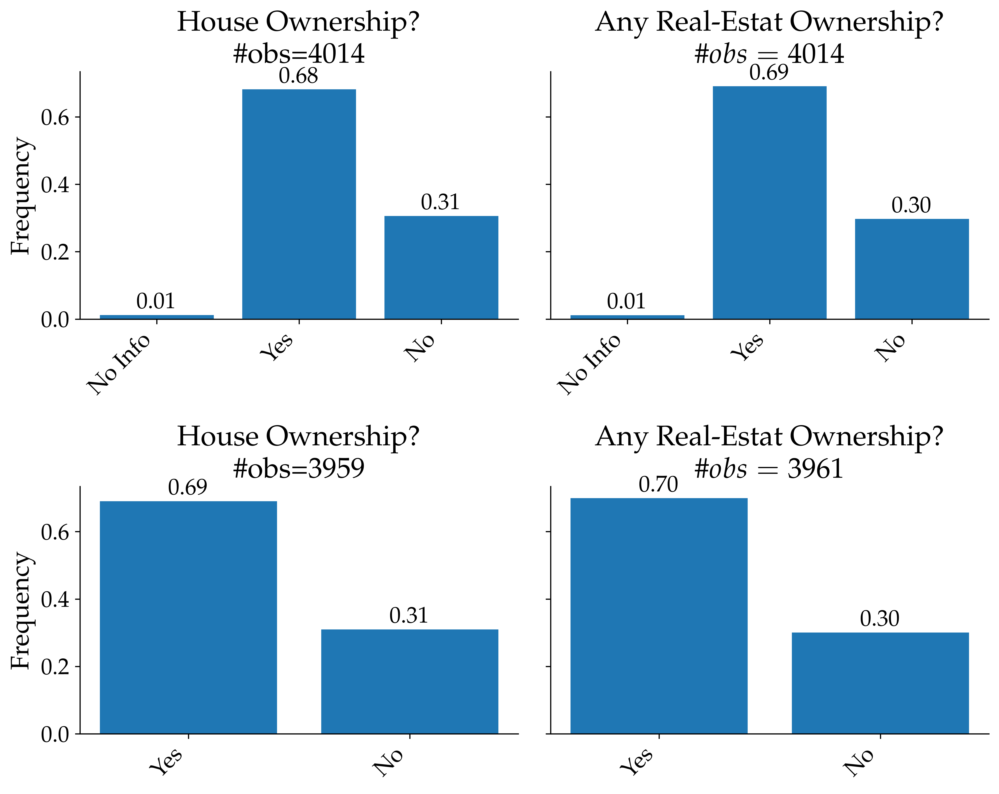

In [6]:
fig, [[ax1,ax2],[ax3,ax4]] = plt.subplots(2,2,sharey=True,figsize=(10,8))
# plot histogram for 'Baalut_Flag'
# select only MishkalMb and Baalut_Flag fields
df_temp = df_mb[['MishkalMb','Baalut_Flag']].copy()
df_temp['Baalut_Flag'].replace([np.nan],0,inplace=True) # just for the plot
title='House Ownership? \n \#obs='+str(df_temp.shape[0])
labels=['No Info','Yes','No']
ncp.plot_hist_discrete(df_temp,'Baalut_Flag','MishkalMb',labels=labels,title=title,ax=ax1)
# plot histogram for 'BaalutNadlan_Flag'
df_temp = df_mb[['MishkalMb','BaalutNadlan_Flag']].copy()
df_temp['BaalutNadlan_Flag'].replace([np.nan],0,inplace=True) # just for the plot
title='Any Real-Estat Ownership? \n $\#obs='+str(df_temp.shape[0])+'$'
ncp.plot_hist_discrete(df_temp,'BaalutNadlan_Flag','MishkalMb',labels=labels,title=title,ax=ax2)

# plot histogram for 'Baalut_Flag'
# select only MishkalMb and Baalut_Flag fields
df_temp = df_mb[['MishkalMb','Baalut_Flag']].copy()
df_temp.dropna(inplace=True) # just for the plot
title='House Ownership? \n \#obs='+str(df_temp.shape[0])
labels=['Yes','No']
ncp.plot_hist_discrete(df_temp,'Baalut_Flag','MishkalMb',labels=labels,title=title,ax=ax3)
# plot histogram for 'BaalutNadlan_Flag'
df_temp = df_mb[['MishkalMb','BaalutNadlan_Flag']].copy()
df_temp.dropna(inplace=True) # just for the plot
title='Any Real-Estat Ownership? \n $\#obs='+str(df_temp.shape[0])+'$'
ncp.plot_hist_discrete(df_temp,'BaalutNadlan_Flag','MishkalMb',labels=labels,title=title,ax=ax4)

fig.tight_layout()
plt.show() 

So, about 70% of the households have house or other real-estate ownership. Now,

### Step 2: we will find how many houseowners give an estimate of their **house value**.

In [7]:
df_mb['SchumShuviDirot'] = df_mb[['M_ShuviDira','ShuviDirotLoMegurim1']].sum(axis='columns')
# if 'Baalut_Flag' is not 1, then 'SchumShuviDirot' is 0
df_mb.loc[df_mb['Baalut_Flag']!=1,'SchumShuviDirot'] = np.nan
df_mb['SchumShuviDirot'].replace([0],np.nan,inplace=True)

df_mb['SchumShuviRealEstate'] = df_mb[['SchumShuviDirot','m_Mechirkarka']].sum(axis='columns')
# if 'BaalutNadlan_Flag' is not 1, then 'SchumShuviRealEstate' is 0
df_mb.loc[df_mb['BaalutNadlan_Flag']!=1,'SchumShuviRealEstate'] = np.nan
df_mb['SchumShuviRealEstate'].replace([0],np.nan,inplace=True)

# list all fields in the curent cell
cols_Dira = ['Siduri','k_baalut1','BaalutDiraLLoBealim1','BaalutDiraNosefet1','Baalut_Flag','KarkaChaklait1','KarkaLoChaklait1','KarkaAcheret1','BaalutNadlan_Flag','M_ShuviDira','ShuviDirotLoMegurim1','m_Mechirkarka','SchumShuviDirot','SchumShuviRealEstate']
# resave the data to file
df_mb[cols_Dira].to_excel(file_path+'df_mb_Dira.xlsx', index=False)

20.0% of the population have real estate value below: 1,000,000 NIS


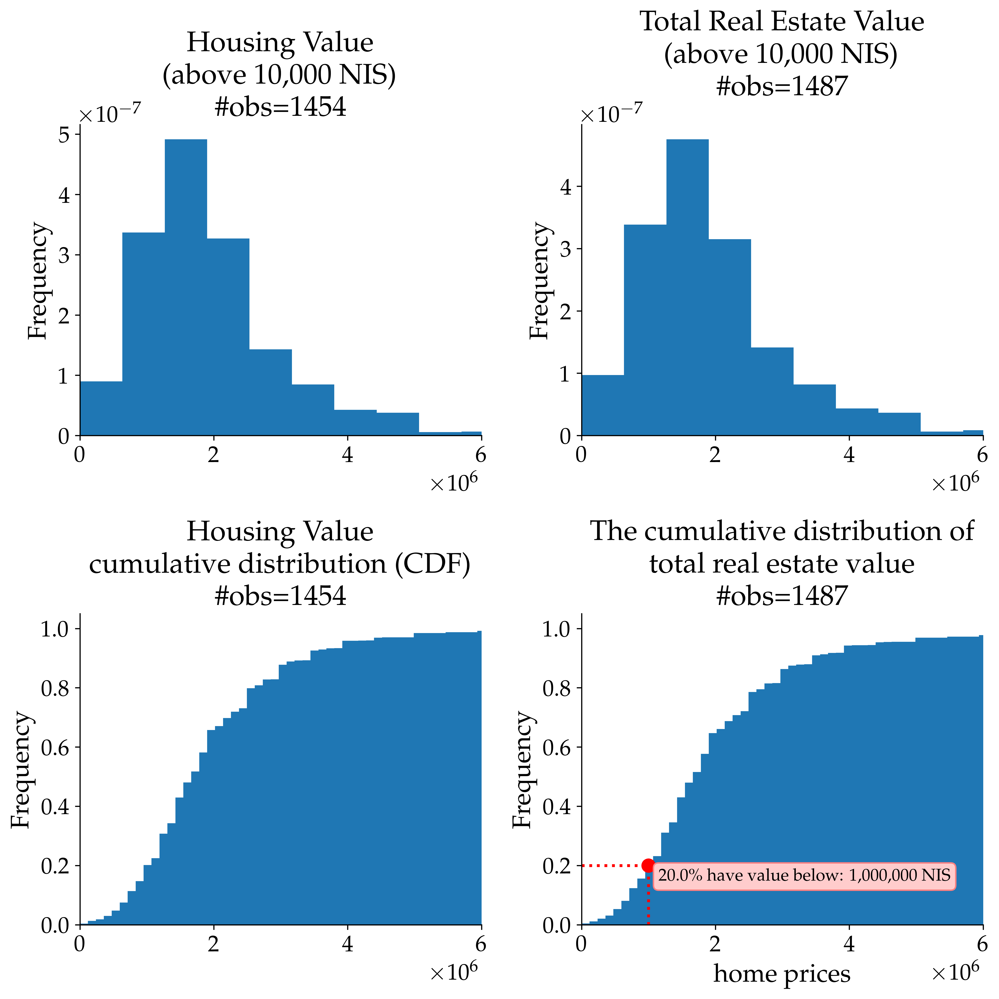

In [50]:
fig, [[ax1,ax2],[ax3,ax4]] = plt.subplots(2,2,figsize=(10,10))
Value_limit_to_present = 6*10**6

# plot histogram for 'SchumShuviDirot'
df_temp = df_mb[['MishkalMb','SchumShuviDirot']].dropna()
# take only SchumShuviDirot field that are higher then 50,000 and smaller then 2,000,000
df_temp = df_temp[df_temp['SchumShuviDirot']>10*10**3]
title='Housing Value \n (above 10,000 NIS) \n \#obs='+str(df_temp.shape[0])
df_temp.plot.hist(column='SchumShuviDirot', bins=150, density=True,weights=df_temp['MishkalMb'], ax=ax1,legend=False,title=title)
ax1.set_xlim(0,Value_limit_to_present)

# plot CDF histogram for 'SchumShuviDirot'
df_temp = df_mb[['MishkalMb','SchumShuviDirot']].dropna()
title='Housing Value \n cumulative distribution (CDF) \n \#obs='+str(df_temp.shape[0])
df_temp.plot.hist(column='SchumShuviDirot', bins=800, density=True, cumulative=True, weights=df_temp['MishkalMb'], ax=ax3,legend=False,title=title) 
ax3.set_xlim(0,Value_limit_to_present)

# plot histogram for 'SchumShuviRealEstate'
df_temp = df_mb[['MishkalMb','SchumShuviRealEstate']].dropna()
# take only SchumShuviRealEstate field that are higher then 300,000 and smaller then 2,000,000
df_temp = df_temp[df_temp['SchumShuviRealEstate']>10*10**3]
title='Total Real Estate Value \n (above 10,000 NIS) \n \#obs='+str(df_temp.shape[0])
df_temp.plot.hist(column='SchumShuviRealEstate', bins=150, density=True,weights=df_temp['MishkalMb'], ax=ax2,legend=False,title=title)
ax2.set_xlim(0,Value_limit_to_present)


# plot CDF histogram for SchumShuviRealEstate 
df_temp = df_mb[['MishkalMb','SchumShuviRealEstate']].dropna()
title='The cumulative distribution of \n total real estate value \n \#obs='+str(df_temp.shape[0])
df_temp.plot.hist(column='SchumShuviRealEstate', bins=800, density=True, cumulative=True, weights=df_temp['MishkalMb'], ax=ax4,legend=False,title=title)
ax4.set_xlim(0,Value_limit_to_present)
ax4.set_xlabel('home prices')


# get the CDF value for Q percentiles
Q = 0.20  # 0.1 in the baseline calculation
# sort by 'SchumShuviRealEstate' and calculate the CDF
df_temp.sort_values(by=['SchumShuviRealEstate'], inplace=True)
x = df_temp['SchumShuviRealEstate'].values
y = df_temp['MishkalMb'].values
cdf = np.cumsum(y)/np.sum(y)
idx = np.where(cdf>Q)[0][0]

house_value_Q = x[idx]
print(str(100*Q)+'% of the population have real estate value below: '+'{:,}'.format(int(house_value_Q))+' NIS')
# plot the value of Q percentiles
ax4.plot([house_value_Q,house_value_Q],[0,cdf[idx]],'r:')
ax4.plot([0,house_value_Q],[cdf[idx],cdf[idx]],'r:')
ax4.plot([house_value_Q],[cdf[idx]],'ro')
ax4.text(house_value_Q*1.15, cdf[idx]-0.05, '$'+str(100*Q)+'\%$ have value below: '+'{:,}'.format(int(house_value_Q))+' NIS', fontsize=12,
         bbox=dict(boxstyle="round",ec=(1., 0.5, 0.5),fc=(1., 0.8, 0.8) ))
# 'SchumHalvaaLoDiyur1',     # What is the disposal balance for the non-housing loan? If there is more than one loan, please refer to the total amount of all loans

fig.tight_layout()
plt.show() 

### Step 3: Calculate the total amount of debt for each household

In [9]:
# First, just to identifiy the number of HH's with loans
df_mb['Halvaa_Flag']=np.nan # 'No Info'
df_mb.loc[(df_mb['m_HalvaaDiyur']==1)|(df_mb['m_HalvaaLoDiyur']==1),'Halvaa_Flag'] = 1 # 'Yes'
df_mb.loc[(df_mb['m_HalvaaDiyur']==2)&(df_mb['m_HalvaaLoDiyur']==2),'Halvaa_Flag'] = 2 # 'No'
# Second, check is household real-estate ownership with loan
df_mb['Has_RealEstate_Is_Loan_Flag']=np.nan # Given that the household has real-estate, does it have loan?
df_mb.loc[(df_mb['BaalutNadlan_Flag']==1)&(df_mb['Halvaa_Flag']==1),'Has_RealEstate_Is_Loan_Flag'] = 1 # Has real-estate and loan
df_mb.loc[(df_mb['BaalutNadlan_Flag']==1)&(df_mb['Halvaa_Flag']==2),'Has_RealEstate_Is_Loan_Flag'] = 2 # Has real-estate but no loan
df_mb.loc[(df_mb['BaalutNadlan_Flag']==2)&(df_mb['Halvaa_Flag']==1),'Has_RealEstate_Is_Loan_Flag'] = 3 # No real-estate but has loan
df_mb.loc[(df_mb['BaalutNadlan_Flag']==2)&(df_mb['Halvaa_Flag']==2),'Has_RealEstate_Is_Loan_Flag'] = 4 # No real-estate and no loan

# Lastly, find just known loans amount
# create a new column with the sum of housing loans and non-housing loans
df_mb['SchumHalvaa'] = df_mb[['m_SchumHalvaaDiyur1','SchumHalvaaLoDiyur1']].sum(axis='columns')
df_mb.loc[(df_mb['Halvaa_Flag']!=1),'SchumHalvaa'] = np.nan
df_mb['SchumHalvaa'].replace([0],np.nan,inplace=True)
# save the data to file
cols_Halvaa = ['Siduri','m_HalvaaDiyur','m_HalvaaLoDiyur','Halvaa_Flag','Has_RealEstate_Is_Loan_Flag','m_SchumHalvaaDiyur1','SchumHalvaaLoDiyur1','SchumHalvaa','SchumShuviRealEstate']
df_mb[cols_Halvaa].to_excel(file_path+'df_mb_Halvaa.xlsx', index=False)

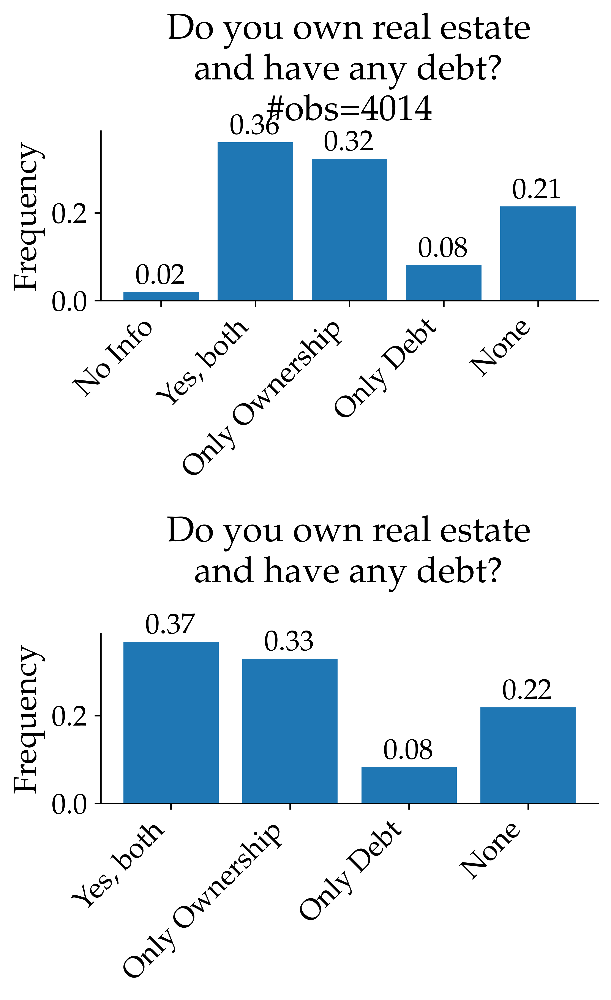

In [10]:
fig, [ax1,ax2] = plt.subplots(2,1,sharey=True,figsize=(5,8))
# plot histogram for 'Has_RealEstate_Is_Loan_Flag'
df_temp = df_mb[['MishkalMb','Has_RealEstate_Is_Loan_Flag']].copy()
df_temp['Has_RealEstate_Is_Loan_Flag'].replace([np.nan],0,inplace=True) # just for the plot
title='Do you own real estate \n and have any debt? \n \#obs='+str(df_temp.shape[0])
labels=['No Info','Yes, both','Only Ownership','Only Debt','None']
ncp.plot_hist_discrete(df_temp,'Has_RealEstate_Is_Loan_Flag','MishkalMb',labels=labels,title=title,ax=ax1)

# plot histogram for 'Baalut_Flag'
# select only MishkalMb and Baalut_Flag fields
df_temp = df_mb[['MishkalMb','Has_RealEstate_Is_Loan_Flag']].dropna()
#title='Do you own real estate \n and have any debt? \n \#obs='+str(df_temp.shape[0])
title='Do you own real estate \n and have any debt? \n  '#\#obs='+str(df_temp.shape[0])
labels=['Yes, both','Only Ownership','Only Debt','None']
#ncp.plot_hist_discrete(df_temp,'Has_RealEstate_Is_Loan_Flag','MishkalMb',labels=labels,title=title,ax=ax2)
ncp.plot_hist_discrete(df_temp,'Has_RealEstate_Is_Loan_Flag','MishkalMb',labels=labels,title=title,ax=ax2)

fig.tight_layout()
plt.show() 

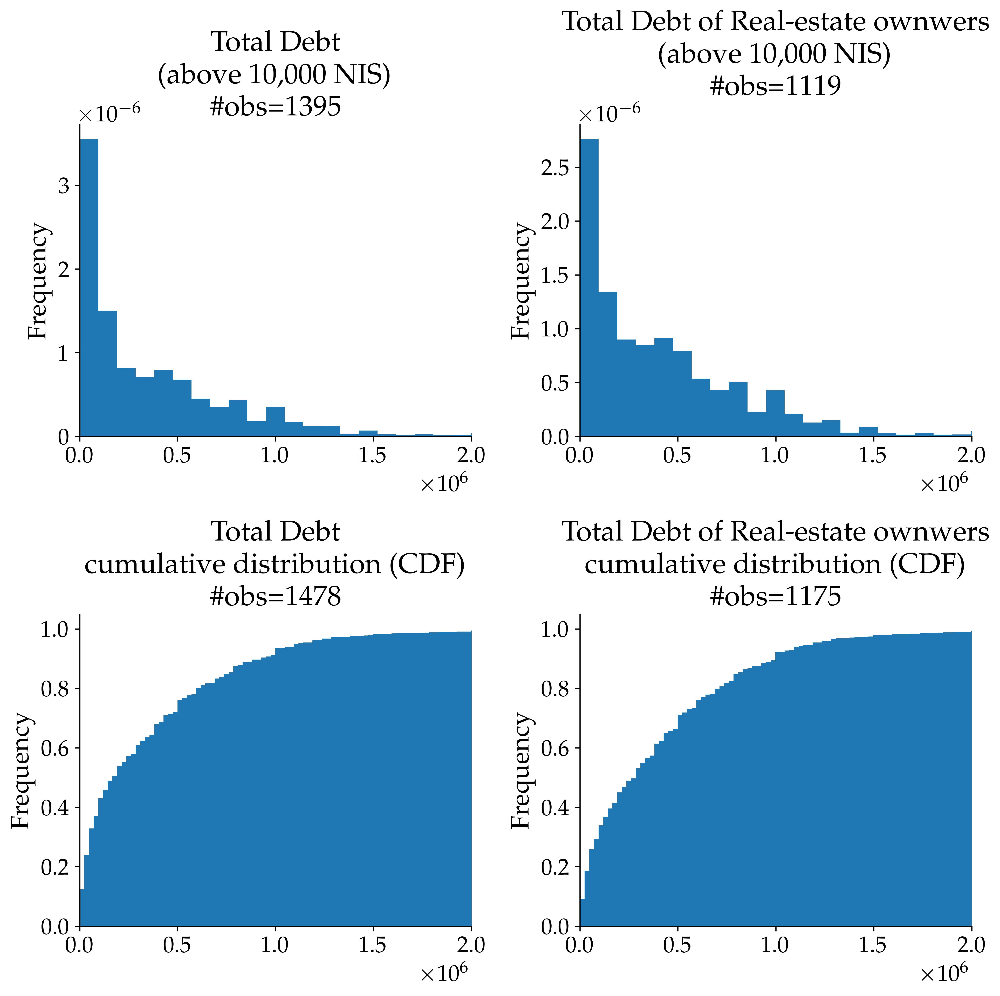

In [11]:
fig, [[ax1,ax2],[ax3,ax4]] = plt.subplots(2,2,figsize=(10,10))
Value_limit_to_present = 2*10**6

# plot histogram for 'SchumHalvaa'
df_temp = df_mb[['MishkalMb','SchumHalvaa']].dropna()
# take only SchumHalvaa field that are higher then 10,000
df_temp = df_temp[df_temp['SchumHalvaa']>10**4]
title='Total Debt \n (above 10,000 NIS) \n \#obs='+str(df_temp.shape[0])
df_temp.plot.hist(column='SchumHalvaa', bins=100, density=True,weights=df_temp['MishkalMb'], ax=ax1,legend=False,title=title)
ax1.set_xlim(0,Value_limit_to_present)

# plot CDF histogram for 'SchumHalvaa'
df_temp = df_mb[['MishkalMb','SchumHalvaa']].dropna()
title='Total Debt \n cumulative distribution (CDF) \n \#obs='+str(df_temp.shape[0])
df_temp.plot.hist(column='SchumHalvaa', bins=400, density=True, cumulative=True, weights=df_temp['MishkalMb'], ax=ax3,legend=False,title=title) 
ax3.set_xlim(0,Value_limit_to_present)

# plot histogram for 'SchumHalvaa' only for households with real-estate
df_temp = df_mb[['MishkalMb','SchumHalvaa','Has_RealEstate_Is_Loan_Flag']].dropna()
# take only SchumHalvaa field that are higher then 10,000
df_temp = df_temp[(df_temp['SchumHalvaa']>10**4)&(df_temp['Has_RealEstate_Is_Loan_Flag']==1)]
title='Total Debt of Real-estate ownwers \n (above 10,000 NIS) \n \#obs='+str(df_temp.shape[0])
df_temp.plot.hist(column='SchumHalvaa', bins=100, density=True,weights=df_temp['MishkalMb'], ax=ax2,legend=False,title=title)
ax2.set_xlim(0,Value_limit_to_present)

# plot CDF histogram for 'SchumHalvaa'
df_temp = df_mb[['MishkalMb','SchumHalvaa','Has_RealEstate_Is_Loan_Flag']].dropna()
# take only SchumHalvaa field that are higher then 10,000
df_temp = df_temp[(df_temp['Has_RealEstate_Is_Loan_Flag']==1)]
title='Total Debt of Real-estate ownwers \n cumulative distribution (CDF) \n \#obs='+str(df_temp.shape[0])
df_temp.plot.hist(column='SchumHalvaa', bins=400, density=True, cumulative=True, weights=df_temp['MishkalMb'], ax=ax4,legend=False,title=title) 
ax4.set_xlim(0,Value_limit_to_present)

fig.tight_layout()
plt.show() 

### Step 4: Calculate LTV ratio for each household
For each household, we will calculate the LTV ratio as follows:

 $ LTV = \frac{Total\ Debt}{House\ Value} $

 Note that we will take into acount all the debt, not only the mortgage debt, since when bank issues a mortgage, it takes into account all the debt of the household. Moreover, we will take into account the house value as the estimated value given by the household, of his housing and othe real-estate assets, since all of them can be used as colleterals.

In [12]:
# calc LTV aproximation
SchumShuviRealEstate_Treshold = 200*10**3   # if 0 then we get more 10 observations, but crazy LTV values for them. so it is better to take 200,000 NIS as a treshold

df_mb['LTV'] = np.nan
# if HH has real estate assets, and has debt, then calc LTV
df_mb.loc[(df_mb['SchumShuviRealEstate']>SchumShuviRealEstate_Treshold)&(df_mb['Has_RealEstate_Is_Loan_Flag']==1),'LTV'] = df_mb['SchumHalvaa']/df_mb['SchumShuviRealEstate']

# save the data to file
cols_Halvaa = ['Siduri','m_HalvaaDiyur','m_HalvaaLoDiyur','Halvaa_Flag','Has_RealEstate_Is_Loan_Flag','m_SchumHalvaaDiyur1','SchumHalvaaLoDiyur1','SchumHalvaa','SchumShuviRealEstate','LTV']
df_mb[cols_Halvaa].to_excel(file_path+'df_mb_Halvaa.xlsx', index=False)

df_mb[['LTV']].describe()

# this is for house owners with mortgage
# need to calculate the shafe of house owners without mortgage (all are unconstrained)
# need to calculate for the rentres


,LTV
count,822.00
mean,0.26
std,0.28
min,0.00
25%,0.06
50%,0.19
75%,0.39
max,3.71


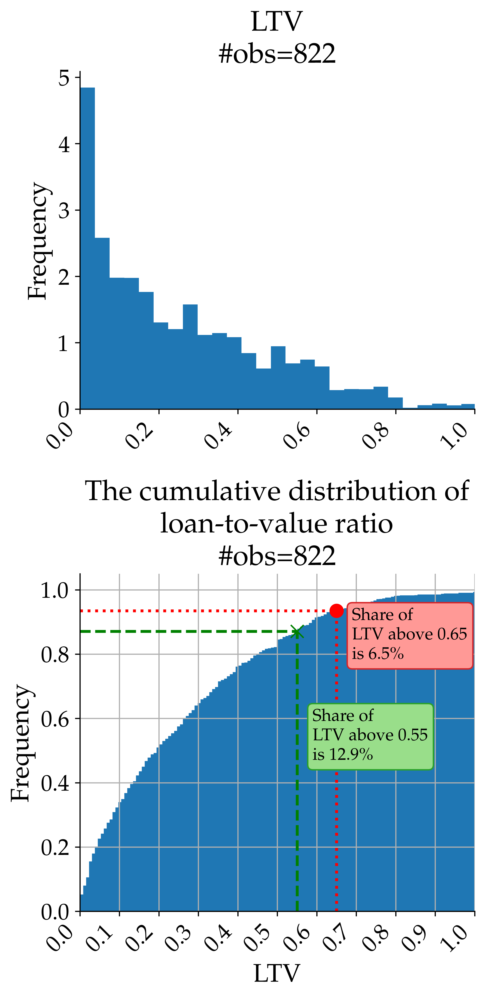

In [31]:
fig, [ax1,ax2] = plt.subplots(2,1,figsize=(5,10))
# plot histogram for 'LTV'
df_temp = df_mb[['MishkalMb','LTV']].dropna()
title='LTV \n \#obs='+str(df_temp.shape[0])
df_temp['LTV'].plot.hist(bins=100,density=True,weights=df_temp['MishkalMb'], ax=ax1,legend=False,title=title)
ax1.set_xlim(0.0,1.0)
ncp.rot_xlabel(ax1,rotation=45)

# plot CDF histogram for SchumShuviRealEstate 
title='The cumulative distribution of \n loan-to-value ratio \n \#obs='+str(df_temp.shape[0])
df_temp['LTV'].plot.hist(bins=500, density=True, cumulative=True, weights=df_temp['MishkalMb'], ax=ax2,legend=False,title=title,grid=True)
# set xticks to 0.1
ax2.set_xticks(np.arange(0, 2.1, 0.1))
ax2.set_xlim(0.0,1.0)
ncp.rot_xlabel(ax2,rotation=45)
ax2.set_xlabel('LTV')

# get the whigted CDF value for LTV=m
m=0.65
whighted_Sum_bellow = df_temp.loc[df_temp['LTV']<=m, 'MishkalMb'].sum()
whighted_Sum_all    = df_temp['MishkalMb'].sum()
CDF_m = whighted_Sum_bellow/whighted_Sum_all
Share_1 = 1-CDF_m 
# plot the CDF value for LTV=m
ax2.plot([m,m],[0,CDF_m],'r:')
ax2.plot([0,m],[CDF_m,CDF_m],'r:')
ax2.plot([m],[CDF_m],'ro')
ax2.text(m+0.04, CDF_m-0.15, 'Share of \n LTV above '+str(m)+'\n is $'+str(round(100*Share_1,1))+'\% $', fontsize=12,
         bbox=dict(boxstyle="round",ec=(0.84, 0.15, 0.16),fc=(1., 0.6, 0.59) )) # ec=(1., 0.5, 0.5),fc=(1., 0.8, 0.8)

# get the whigted CDF value for LTV=m
m2=0.55
whighted_Sum_bellow = df_temp.loc[df_temp['LTV']<=m2, 'MishkalMb'].sum()
whighted_Sum_all    = df_temp['MishkalMb'].sum()
CDF_m2 = whighted_Sum_bellow/whighted_Sum_all
Share_2 = 1-CDF_m2
# plot the CDF value for LTV=m
ax2.plot([m2,m2],[0,CDF_m2],'g--')
ax2.plot([0,m2],[CDF_m2,CDF_m2],'g--')
ax2.plot([m2],[CDF_m2],'gx')
ax2.text(m2+0.04, CDF_m2-0.4, 'Share of \n LTV above '+str(m2)+'\n is $'+str(round(100*(Share_2),1))+'\% $', fontsize=12,
         bbox=dict(boxstyle="round",ec=(0.17,0.63,0.17),fc=(0.60,0.87,0.54))) 

fig.tight_layout()
plt.show() 

In [32]:
ShareStr = str(round(100*Share_1,1))+'%'
LTV_th_Str = str(round(100*m))+'%'
Owen_w_Debt = 0.37 # as in 2016
Owen_w_Debt_Str = str(round(100*Owen_w_Debt,1))+'%'
Constrain_1 = Owen_w_Debt * Share_1
Constrain_1_Str = str(round(100*Constrain_1,1))+'%'
print(
    'About '+ShareStr+' of the households with house ownership with mortgages are constrained ('+Owen_w_Debt_Str+' of the entire population), \n',
    'because of their high LTV ratio (>'+LTV_th_Str+'). \n',
    'Which means that',
    Constrain_1_Str+' (='+ShareStr+'*'+ Owen_w_Debt_Str+') from the entire population is constrained.')

About 6.5% of the households with house ownership with mortgages are constrained (37.0% of the entire population), 
 because of their high LTV ratio (>65%). 
 Which means that 2.4% (=6.5%*37.0%) from the entire population is constrained.


In [27]:
ShareStr = str(round(100*Share_2,1))+'%'
LTV_th_Str = str(round(100*m2))+'%'
Owen_w_Debt = 0.37 # as in 2016
Owen_w_Debt_Str = str(round(100*Owen_w_Debt,1))+'%'
Constrain_2 = Owen_w_Debt * Share_2
Constrain_2_Str = str(round(100*Constrain_2,1))+'%'
print(
    'About '+ShareStr+' of the households with house ownership with mortgages are constrained ('+Owen_w_Debt_Str+' of the entire population), \n',
    'because of their high LTV ratio (>'+LTV_th_Str+'). \n',
    'Which means that',
    Constrain_2_Str+' (='+ShareStr+'*'+ Owen_w_Debt_Str+') from the entire population is constrained.')

About 12.9% of the households with house ownership with mortgages are constrained (37.0% of the entire population), 
 because of their high LTV ratio (>55%). 
 Which means that 4.8% (=12.9%*37.0%) from the entire population is constrained.


Next, we should understand how many of the households without house ownership (30% of the entire population [32% in 2016]) are constrained. 
To that purpose, we will calculate the total wealth of each household, and then we will try to find apropreate treshold which is enough (potentialy) to pruchase a typical house with LTV lower than 65%.

Total wealth is calculated as follows:
total savings + total debt + total value of house and other real-estate assets

In [15]:
# if Pikadon in Dolars, then multiply by Shekel/Dolar rate (ShDo)
ShDo = 3.85 # as of 01-06-2016
df_mb.loc[df_mb['MatbeaPikdon1']==2,'HaskaPikdon1'] = ShDo * df_mb['HaskaPikdon1']
#df_mb.loc[df_mb['MatbeaPikdon1']==2,'HaskaPikdon1'] = ShDo * df_mb.loc[df_mb['MatbeaPikdon1']==2,'HaskaPikdon1']
df_mb.loc[df_mb['MatbeaChisachon1']==2,'HaskaChisachon1'] = ShDo * df_mb.loc[df_mb['MatbeaChisachon1']==2,'HaskaChisachon1']
df_mb.loc[df_mb['MatbeaNeemanut1']==2,'HaskaNeemanut1'] = ShDo * df_mb.loc[df_mb['MatbeaNeemanut1']==2,'HaskaNeemanut1']
df_mb.loc[df_mb['MatbeaLoNeemanut1']==2,'HaskaLoNeemanut1'] = ShDo * df_mb.loc[df_mb['MatbeaLoNeemanut1']==2,'HaskaLoNeemanut1']

df_mb['SchumPikdonotAll'] = df_mb[['HaskaPikdon1','HaskaChisachon1','HaskaNeemanut1','HaskaLoNeemanut1']].sum(axis='columns',min_count=1)
df_mb['SchumSaving']= df_mb[['m_KesefKniyaAtidit','SchumPikdonotAll']].max(axis='columns') # take the largest value between m_KesefKniyaAtidit and SchumPikdonotAll
df_mb['SchumSavingNetDebt']= df_mb['SchumSaving'] - df_mb['SchumHalvaa'].replace([np.nan],0) 
# calculate total savings 
cols_Saving = ['Siduri','BaalutNadlan_Flag','SchumShuviRealEstate','Halvaa_Flag','SchumHalvaa','m_KesefKniyaAtidit','HaskaPikdon1','MatbeaPikdon1','HaskaChisachon1','MatbeaChisachon1','HaskaNeemanut1','MatbeaNeemanut1','HaskaLoNeemanut1','MatbeaLoNeemanut1','SchumPikdonotAll','SchumSaving','SchumSavingNetDebt']

df_mb[cols_Saving].to_excel(file_path+'df_mb_Saving.xlsx', index=False)


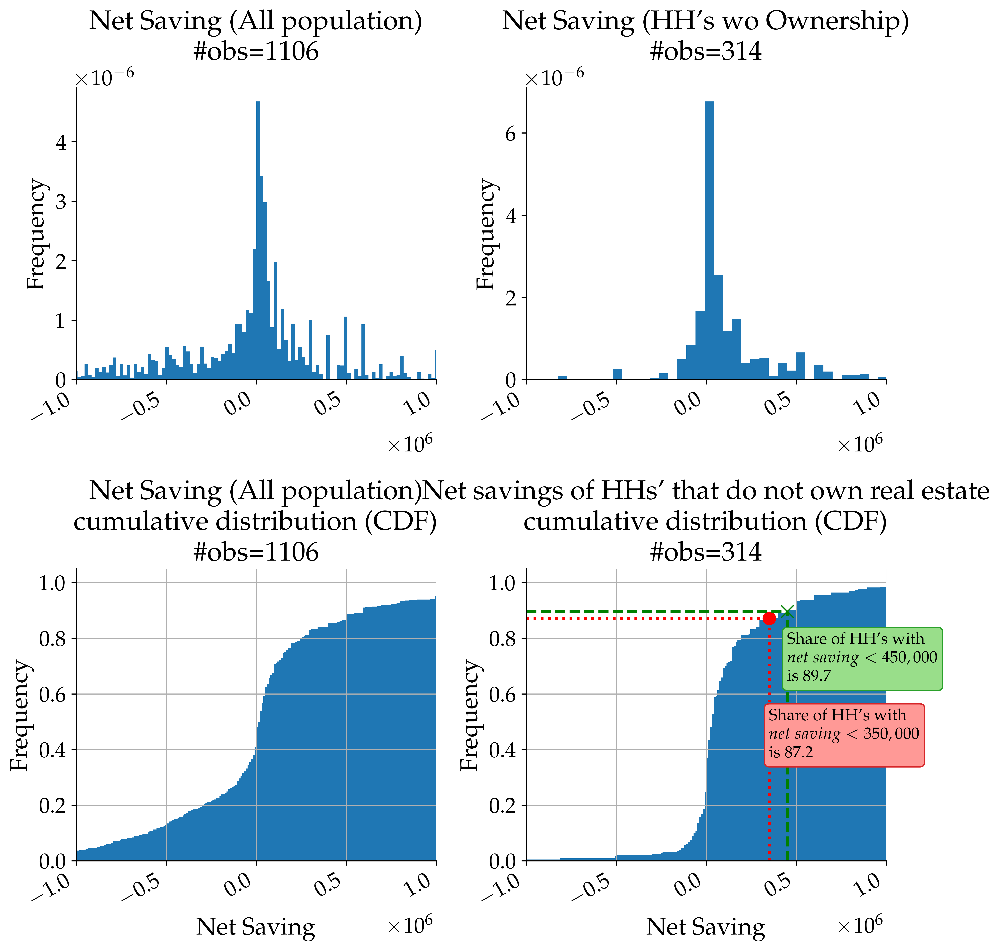

In [55]:
fig, [[ax1,ax2],[ax3,ax4]] = plt.subplots(2,2,figsize=(10,10))
lower_limit = -1*10**6
upper_limit =  1*10**6
limits_to_present = [lower_limit , upper_limit ]
# plot histogram for 'Schum Saving Net Debt'
df_temp = df_mb[['MishkalMb','SchumSavingNetDebt']].dropna()
# take only SchumSavingNetDebt field for households without ownership
title='Net Saving (All population)\n \#obs='+str(df_temp.shape[0])
df_temp['SchumSavingNetDebt'].plot.hist(bins=500,density=True,weights=df_temp['MishkalMb'], ax=ax1,legend=False,title=title)
ax1.set_xlim(limits_to_present)
ncp.rot_xlabel(ax1,rotation=30)

# plot CDF histogram for SchumShuviRealEstate 
df_temp = df_mb[['MishkalMb','SchumSavingNetDebt']].dropna()
title='Net Saving (All population) \n cumulative distribution (CDF) \n \#obs='+str(df_temp.shape[0])
df_temp['SchumSavingNetDebt'].plot.hist(bins=1000, density=True, cumulative=True, weights=df_temp['MishkalMb'], ax=ax3,legend=False,title=title,grid=True)
# set xticks to 0.1
ax3.set_xlim(limits_to_present)
#ax2.set_xticks(np.arange(0, 2.1, 0.1))
ncp.rot_xlabel(ax3,rotation=30)
ax3.set_xlabel('Net Saving')

#limits_to_present = [-250*10**3 , 0.5*10**6 ]
# plot histogram for 'Schum Saving Net Debt' only for households without Real-Estate ownership
# take only SchumSavingNetDebt field for households without ownership
df_temp = df_mb.loc[df_mb['BaalutNadlan_Flag']==2,['MishkalMb','SchumSavingNetDebt']].dropna()
title='Net Saving  (HH\'s wo Ownership) \n \#obs='+str(df_temp.shape[0])
df_temp['SchumSavingNetDebt'].plot.hist(bins=100,density=True,weights=df_temp['MishkalMb'], ax=ax2,legend=False,title=title)
ax2.set_xlim(limits_to_present)
ncp.rot_xlabel(ax2,rotation=30)

# plot CDF histogram for SchumShuviRealEstate 
title='Net savings of HHs\' that do not own real estate \n cumulative distribution (CDF) \n \#obs='+str(df_temp.shape[0])
df_temp['SchumSavingNetDebt'].plot.hist(bins=500, density=True, cumulative=True, weights=df_temp['MishkalMb'], ax=ax4,legend=False,title=title,grid=True)
ax4.set_xlim(limits_to_present)
#ax2.set_xticks(np.arange(0, 2.1, 0.1))
ncp.rot_xlabel(ax4,rotation=30)
ax4.set_xlabel('Net Saving')

# get the whigted CDF value for Net Saving larger then 200,000
m3 =  house_value_Q * 0.35 # take the value of lower real-estate value and assume LTV of 65% - this is optimistic assumption for the treshold for households to get a mortgage wihch is not constrained
whighted_Sum_bellow = df_temp.loc[df_temp['SchumSavingNetDebt']<=m3, 'MishkalMb'].sum()
whighted_Sum_all    = df_temp['MishkalMb'].sum()
CDF_m3 = whighted_Sum_bellow/whighted_Sum_all
# plot the CDF value for LTV=m
ax4.plot([m3,m3],[0,CDF_m3],'r:')
ax4.plot([lower_limit,m3],[CDF_m3,CDF_m3],'r:')
ax4.plot([m3],[CDF_m3],'ro')
Constrain_share_3_str = str(round(100*(CDF_m3),1))+'%' 
ax4.text(m3+0.2, CDF_m3-0.5, 'Share of HH\'s with \n $net\ saving <'+'{:,}'.format(int(m3))+' $\n is '+Constrain_share_3_str, fontsize=12, bbox=dict(boxstyle="round",ec=(0.84, 0.15, 0.16),fc=(1., 0.6, 0.59)))

m4 =  house_value_Q * 0.45 # take the value of lower real-estate value and assume LTV of 55% - this is optimistic assumption for the treshold for households to get a mortgage wihch is not constrained
whighted_Sum_bellow = df_temp.loc[df_temp['SchumSavingNetDebt']<=m4, 'MishkalMb'].sum()
whighted_Sum_all    = df_temp['MishkalMb'].sum()
CDF_m4 = whighted_Sum_bellow/whighted_Sum_all
# plot the CDF value for LTV=m
ax4.plot([m4,m4],[0,CDF_m4],'g--')
ax4.plot([lower_limit,m4],[CDF_m4,CDF_m4],'g--')
ax4.plot([m4],[CDF_m4],'gx')
Constrain_share_4_str = str(round(100*(CDF_m4),1))+'%' 
ax4.text(m4+0.2, CDF_m4-0.25, 'Share of HH\'s with \n $net\ saving <'+'{:,}'.format(int(m4))+' $\n is '+Constrain_share_4_str, fontsize=12,bbox=dict(boxstyle="round",ec=(0.17,0.63,0.17),fc=(0.60,0.87,0.54)))

fig.tight_layout()
plt.show() 

In [56]:
woOwnership_share = 0.3 # 0.31 in 2016
OwenwoOwnershio_share_w_Debt_Str = str(round(100*woOwnership_share,1))+'%'
Constrain_3 = woOwnership_share * CDF_m3
Constrain_3_Str = str(round(100*Constrain_3,1))+'%'
print('Approximately '+Constrain_share_3_str+' of households without homeownership potentialy face financial constraints,\n constituting '+Constrain_3_Str+' of the total population \n',
'(calculated as '+Constrain_share_3_str+' multiplied by '+OwenwoOwnershio_share_w_Debt_Str+' the share of households without homeownership). \n This constraint arises due to their anticipated (potencial) high Loan-to-Value (LTV) ratio, exceeding '+LTV_th_Str+',\n',
' assuming they intend to purchase a house priced at the 10th lower percentile.')

Approximately 87.2% of households without homeownership potentialy face financial constraints,
 constituting 26.2% of the total population 
 (calculated as 87.2% multiplied by 30.0% the share of households without homeownership). 
 This constraint arises due to their anticipated (potencial) high Loan-to-Value (LTV) ratio, exceeding 65%,
  assuming they intend to purchase a house priced at the 10th lower percentile.


In [57]:
woOwnership_share = 0.3 # 0.31 in 2016
OwenwoOwnershio_share_w_Debt_Str = str(round(100*woOwnership_share,1))+'%'
Constrain_4 = woOwnership_share * CDF_m4
Constrain_4_Str = str(round(100*Constrain_4,1))+'%'
print('Approximately '+Constrain_share_4_str+' of households without homeownership potentialy face financial constraints,\n constituting '+Constrain_2_Str+' of the total population \n',
'(calculated as '+Constrain_share_4_str+' multiplied by '+OwenwoOwnershio_share_w_Debt_Str+' the share of households without homeownership). \n This constraint arises due to their anticipated (potencial) high Loan-to-Value (LTV) ratio, exceeding '+LTV_th_Str+',\n',
' assuming they intend to purchase a house priced at the 10th lower percentile.')

Approximately 89.7% of households without homeownership potentialy face financial constraints,
 constituting 26.9% of the total population 
 (calculated as 89.7% multiplied by 30.0% the share of households without homeownership). 
 This constraint arises due to their anticipated (potencial) high Loan-to-Value (LTV) ratio, exceeding 65%,
  assuming they intend to purchase a house priced at the 10th lower percentile.


In [61]:
print(
    'Households with house ownership with mortgages contribute '+Constrain_1_Str+' to constrained share in popolation. \n',
    'Households with house ownership with mortgages contribute '+Constrain_3_Str+' to constrained share in popolation. \n',
    'In total, households with house ownership with mortgages contribute '+str(round(100*(Constrain_1+Constrain_3),1))+'% to constrained share in popolation. \n',
)

Households with house ownership with mortgages contribute 2.4% to constrained share in popolation. 
 Households with house ownership with mortgages contribute 26.2% to constrained share in popolation. 
 In total, households with house ownership with mortgages contribute 28.6% to constrained share in popolation. 



## Summery: Share of constrained households in the entire population
Base on CBS long survey data, we can make the following calculation:
* Figure 1 divides the population into 3 groups: 
    * Houseowners without debt (32%), which are totaly unconstrained
    * Houseowners with debt (37%), which are constrained if their LTV ratio is higher than 65% (we will see later that this is 2.9% of the entire population, and for LTV 55% the number are 4.8%)
    * Households without house ownership (32%). Here, taking house value in the lower 10 percentile (about 700,000 NIS), we found that 83.1% of them are constrained (because of their potential high LTV ratio ($>65%$)). Which means that 83.1% * 31% = 25.8%  from the entire population is constrained.{for LTV 55% the number are 87.4% and 27.1%, respectively}
    
In total, **28.7%** of the entire population is constrained (for LTV 55% the number is 31.9%).

## Other calculations

In [19]:

# Calculate the number of apartments per HH
# ------------------------------------------
# if k_baalut1==1 (live in Ownership) then
#      if BaalutDiraLLoBealim1==1 (have apartments) then  # mistakely, but need to be used
#               Number_of_apartments = BaalutDiraLLoBealimKama1
#      else
#           if BaalutDiraNosefet1==1 (have more apartments)
#                   Number_of_apartments = BaalutDiraNosefetKama1 + 1
#           else (have no more apartments)
#                   Number_of_apartments = 1
#
# if k_baalut1!=1 (live in Rent,Family relative,Employer,Friends,Kibbutz,Other) then
#       if BaalutDiraLLoBealim1==1 (have apartments) then
#               Number_of_apartments = BaalutDiraLLoBealimKama1
#       if BaalutDiraLLoBealim1==2 (have no apartments) then
#               Number_of_apartments = 0
df_mb['Number_of_apartments'] = 0
for idx in df_mb.index:
    if df_mb.loc[idx,'k_baalut1']==1: # live in Ownership
        if df_mb.loc[idx,'BaalutDiraLLoBealim1']==1: 
            df_mb.loc[idx,'Number_of_apartments'] = df_mb.loc[idx,'BaalutDiraLLoBealimKama1'] + 1   # questionable if need +1. but this give a more logical results
        else:
            if df_mb.loc[idx,'BaalutDiraNosefet1']==1:
                df_mb.loc[idx,'Number_of_apartments'] = df_mb.loc[idx,'BaalutDiraNosefetKama1'] + 1
            else:
                df_mb.loc[idx,'Number_of_apartments'] = 1

    else:                                # live in Rent,Family relative,Employer,Friends,Kibbutz,Other      
        if df_mb.loc[idx,'BaalutDiraLLoBealim1']==1:
            df_mb.loc[idx,'Number_of_apartments'] = df_mb.loc[idx,'BaalutDiraLLoBealimKama1']
        else:
            df_mb.loc[idx,'Number_of_apartments'] = 0

# find how meny HH's have more than 10 apartments
print('Number of HH with more than 10 apartments:', df_mb[df_mb['Number_of_apartments']>10]['Number_of_apartments'].count())
# compare total number of apartments versus number of HH's
print('Total number of HH:', df_mb['Number_of_apartments'].count())
print('Total number of apartments (with out wight):', df_mb['Number_of_apartments'].sum())

# calculate wighted sum of number of apartments
Normalizing_factor = df_mb['MishkalMb'].sum()
df_mb['Weighted_Number_of_apartments'] = df_mb['Number_of_apartments']*df_mb['MishkalMb']/Normalizing_factor
print('Weighted sum of number of apartments per HH\'s:', round(df_mb['Weighted_Number_of_apartments'].sum(),2))

# for graphical presentation, we will limit the number of apartments to 3
# if Number_of_apartments>3 then put 3 in Number_of_apartments
df_mb.loc[df_mb['Number_of_apartments']>3,'Number_of_apartments'] = 3

Number of HH with more than 10 apartments: 1
Total number of HH: 4009
Total number of apartments (with out wight): 3164.7999999999997
Weighted sum of number of apartments per HH's: 0.79


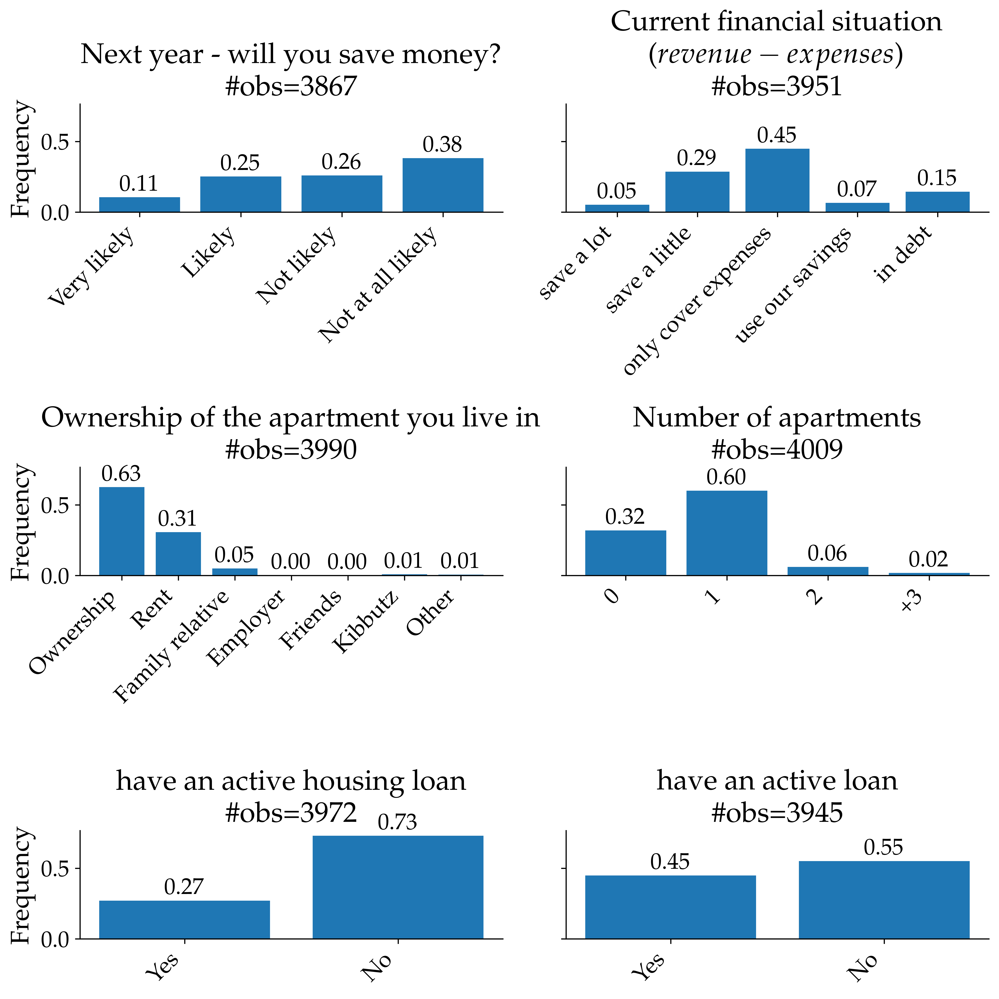

In [20]:
fig, [[ax1,ax2],[ax3,ax4],[ax5,ax6]] = plt.subplots(3,2,sharey=True,figsize=(10,10))

# plot histogram for 'ChisachonAtid1'
# select only MishkalMb and ChisachonAtid1 fields
df_temp = df_mb[['MishkalMb','ChisachonAtid1']].copy()
# drop ChisachonAtid1 field for value > 4
df_temp = df_temp[df_temp['ChisachonAtid1'] <= 4]
ncp.plot_hist_discrete(df_temp,'ChisachonAtid1','MishkalMb',labels=['Very likely','Likely','Not likely','Not at all likely'],
ax=ax1,title='Next year  - will you save money? \n \#obs='+str(df_temp.shape[0]))

# plot histogram for 'ChisachonHayom1'
df_temp = df_mb[['MishkalMb','ChisachonHayom1']].copy()
# drop ChisachonHayom1 field for value > 5
df_temp = df_temp[df_temp['ChisachonHayom1'] <= 5]
title='Current financial situation \n ($ revenue - expenses $) \n \#obs='+str(df_temp.shape[0])
ncp.plot_hist_discrete(df_temp,'ChisachonHayom1','MishkalMb',labels=['save a lot','save a little','only cover expenses','use our savings ','in debt'],title=title,ax=ax2)

# plot histogram for 'k_baalut1'
df_temp = df_mb[['MishkalMb','k_baalut1']].copy()
# drop k_baalut1 field for value > 7
df_temp = df_temp[df_temp['k_baalut1'] <= 7]
ncp.plot_hist_discrete(df_temp,'k_baalut1','MishkalMb',labels=['Ownership','Rent','Family relative','Employer','Friends','Kibbutz','Other'],title='Ownership of the apartment you live in \n \#obs='+str(df_temp.shape[0]),ax=ax3)

# plot histogram for 'Number_of_apartments'
df_temp = df_mb[['MishkalMb','Number_of_apartments']].copy()
# drop Number_of_apartments field for value > 30
df_temp = df_temp[df_temp['Number_of_apartments'] <= 100]
max_apartments = df_temp['Number_of_apartments'].max()
ncp.plot_hist_discrete(df_temp,'Number_of_apartments','MishkalMb',title='Number of apartments \n \#obs='+str(df_temp.shape[0]),labels=['0','1','2','+3'],ax=ax4)

# plot histogram for 'm_HalvaaDiyur'
df_temp = df_mb[['MishkalMb','m_HalvaaDiyur']].copy()
# take only m_HalvaaDiyur field that are in [1,2]
df_temp = df_temp[df_temp['m_HalvaaDiyur'].isin([1,2])]
ncp.plot_hist_discrete(df_temp,'m_HalvaaDiyur','MishkalMb',labels=['Yes','No'],title='have an active housing loan \n \#obs='+str(df_temp.shape[0]),ax=ax5)

# plot histogram for 'm_HalvaaDiyur' and 'm_HalvaaLoDiyur'
df_temp = df_mb[['MishkalMb','m_HalvaaDiyur','m_HalvaaLoDiyur']].copy()
# take only m_HalvaaDiyur field that are in [1,2]
df_temp = df_temp[df_temp['m_HalvaaDiyur'].isin([1,2])]
# take only m_HalvaaLoDiyur field that are in [1,2]
df_temp = df_temp[df_temp['m_HalvaaLoDiyur'].isin([1,2])]
df_temp['Halvaa'] = 1
# if m_HalvaaDiyur=2 and m_HalvaaLoDiyur=2 then Halvaa=2
df_temp.loc[(df_temp['m_HalvaaDiyur']==2) & (df_temp['m_HalvaaLoDiyur']==2),'Halvaa'] = 2
ncp.plot_hist_discrete(df_temp,'Halvaa','MishkalMb',labels=['Yes','No'],title='have an active loan \n \#obs='+str(df_temp.shape[0]),ax=ax6)

fig.tight_layout()
plt.show() 

Few takeaways from the data about constraind households:
1.


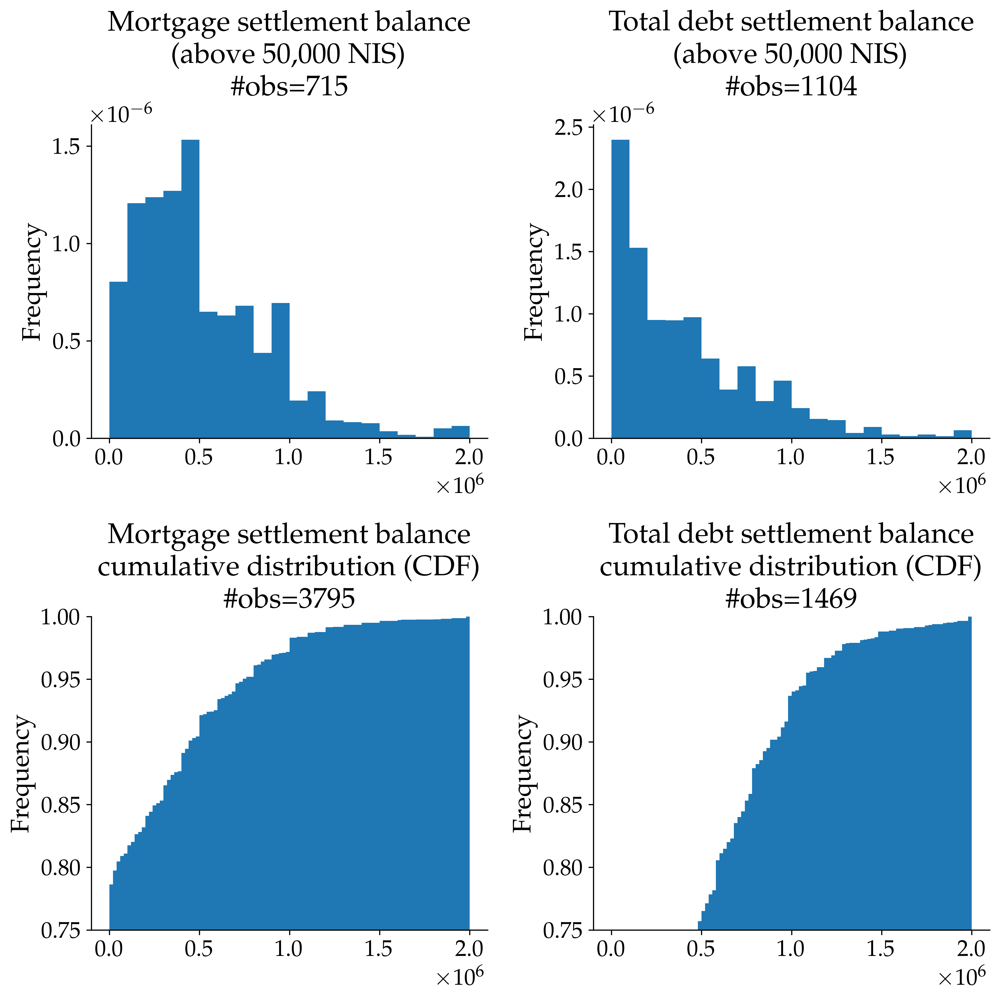

In [21]:
fig, [[ax1,ax2],[ax3,ax4]] = plt.subplots(2,2,figsize=(10,10))
# plot histogram for 'm_SchumHalvaaDiyur1'
df_temp = df_mb[['MishkalMb','m_SchumHalvaaDiyur1']].copy()
# take only m_SchumHalvaaDiyur1 field that are higher then 50,000 and smaller then 2,000,000
df_temp = df_temp[df_temp['m_SchumHalvaaDiyur1'].between(50000,2000000)]
title='Mortgage settlement balance \n (above 50,000 NIS) \n \#obs='+str(df_temp.shape[0])
df_temp.plot.hist(column='m_SchumHalvaaDiyur1', bins=20, density=True,weights=df_temp['MishkalMb'], ax=ax1,legend=False,title=title)

# plot CDF histogram for 'm_SchumHalvaaDiyur1'
df_temp = df_mb[['MishkalMb','m_SchumHalvaaDiyur1']].copy()
# take only m_SchumHalvaaDiyur1 field that are smaller then 2,000,000
df_temp = df_temp[df_temp['m_SchumHalvaaDiyur1']<= 2*10**6]
title='Mortgage settlement balance \n cumulative distribution (CDF) \n \#obs='+str(df_temp.shape[0])
df_temp.plot.hist(column='m_SchumHalvaaDiyur1', bins=100, density=True, cumulative=True, weights=df_temp['MishkalMb'], ax=ax3,legend=False,title=title) 
ax3.set_ylim(0.75,1.0)

# plot histogram for 'm_SchumHalvaaLoDiyur1' and 'm_SchumHalvaaDiyur1'
df_temp = df_mb[['MishkalMb','SchumHalvaa']].copy()
# take only m_SchumHalvaa field that are higher then 50,000 and smaller then 2,000,000
df_temp = df_temp[df_temp['SchumHalvaa'].between(50000,2000000)]
title='Total debt settlement balance \n (above 50,000 NIS) \n \#obs='+str(df_temp.shape[0])
df_temp.plot.hist(column='SchumHalvaa', bins=20, density=True,weights=df_temp['MishkalMb'], ax=ax2,legend=False,title=title)

# plot CDF histogram for m_SchumHalvaa 
df_temp = df_mb[['MishkalMb','SchumHalvaa']].copy()
# take only m_SchumHalvaa field that are smaller then 2,000,000
df_temp = df_temp[df_temp['SchumHalvaa']<= 2*10**6]
title='Total debt settlement balance \n cumulative distribution (CDF) \n \#obs='+str(df_temp.shape[0])
df_temp.plot.hist(column='SchumHalvaa', bins=100, density=True, cumulative=True, weights=df_temp['MishkalMb'], ax=ax4,legend=False,title=title)
ax4.set_ylim(0.75,1.0)

# 'SchumHalvaaLoDiyur1',     # What is the disposal balance for the non-housing loan? If there is more than one loan, please refer to the total amount of all loans

fig.tight_layout()
plt.show() 

In [22]:
#! jupyter nbconvert --output-dir='./tex' --no-input --to=latex Ownership_in_Israel_Long_Survy_5_2018 --no-prompt